In [1]:
import json
import pandas as pd
import osmnx as ox
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import networkx as nx
import geopandas as gpd
import pickle
import seaborn as sns

from shapely.geometry import box
from networkx import connected_components
from shapely.geometry import Point
from geopy.distance import geodesic


import utils_RNVI as utils_RNVI


## Methods

In [2]:

highway_mapping = {
    'primary': 'primary_road',
    'primary_link': 'primary_road',
    'motorway': 'primary_road',
    'motorway_link': 'primary_road',
    'trunk': 'primary_road',
    'trunk_link': 'primary_road',
    'secondary': 'secondary_road',
    'secondary_link': 'secondary_road',
    'tertiary': 'tertiary_road',
    'tertiary_link': 'tertiary_road'}
    
color_mapping = {}
color_mapping['residential_road']='gray'
color_mapping['tertiary_road']='sandybrown'
color_mapping['secondary_road']= 'coral'
color_mapping['primary_road']= 'red'

# Generate spatial and network data

In [3]:
shapefile_path = "../data/BEZIRKSGRENZEOGD"
shapefile_path_census = "../data/ZAEHLBEZIRKOGD"

# load files
gdf_districts = gpd.read_file(shapefile_path)
gdf_census = gpd.read_file(shapefile_path_census)

gdf_districts['DISTRICT_CODE'] = gdf_districts.apply( lambda row: str(int(row['STATAUSTRI']*100)), axis = 1)
gdf_districts = gdf_districts.to_crs(epsg=4326)

gdf_census['STATAUSTRI'] = gdf_census.apply(lambda row: row['BEZNR']+900.0, axis = 1)

In [4]:
df_population = pd.read_csv('../data/wien_pop_district.csv', delimiter = ';')
df_2022 = df_population[df_population['REF_YEAR'] == 2022]

df_population_2022 = df_2022.groupby('DISTRICT_CODE')[['AUT', 'EEA', 'REU', 'TCN']].sum()
df_population_2022['Total_Population'] = df_population_2022.sum(axis=1)

# Reset the index if you want DISTRICT_CODE to be a column instead of the index
df_population_2022 = df_population_2022.reset_index()
df_population_2022['DISTRICT_CODE'] = df_population_2022.apply( lambda row: str(int(row['DISTRICT_CODE'])), axis = 1)

gdf_districts_census = gdf_districts.merge(df_population_2022[['DISTRICT_CODE', 'Total_Population']],
                                           on='DISTRICT_CODE', how='left')

gdf_districts = gdf_districts_census
gdf_districts = gdf_districts.to_crs(epsg=4326)


In [5]:
# load geojson
gdf_nodes = gpd.read_file("../processed/wien_gdf_nodes.geojson")
gdf_edges = gpd.read_file("../processed/wien_gdf_edges.geojson")
gdf_nodes = gdf_nodes.reset_index()
gdf_edges = gdf_edges.reset_index()

# load graph
with open("../processed/wien_G_undirected_new.pkl", "rb") as f:
    G_undirected = pickle.load(f)

Skipping field name: unsupported OGR type: 5
Skipping field width: unsupported OGR type: 5
Skipping field ref: unsupported OGR type: 5
Skipping field tunnel: unsupported OGR type: 5
Skipping field access: unsupported OGR type: 5


# network analysis

In [6]:
# hospitals or police
RESPONDER_TYPE = 'police'
N_RUNS = 15

X_values = [2000, 4000, 6000]
X_area_dict = {2000:'0.2', 4000:'0.5', 6000: '1.0'} # approximate area in square kms

In [7]:
# adding centroids
gdf_edges['centroid'] = gdf_edges.geometry.centroid
G_undirected = G_undirected.subgraph(gdf_nodes.osmid).copy()

gdf_edges['road_classification'] = gdf_edges['highway'].map(highway_mapping).fillna('residential_road')

/var/folders/ms/3n67wbb95xn26d6lg9q5sjw40000gn/T/ipykernel_3355/345116956.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_edges['centroid'] = gdf_edges.geometry.centroid


In [8]:
# gdf responders
gdf_nodes_responders = gdf_nodes[gdf_nodes[RESPONDER_TYPE]==True]

# additional info
node_counts_by_district = utils_RNVI.get_node_counts_by_district(gdf_nodes)
length_by_district = utils_RNVI.calculate_cumulative_length_by_district(gdf_edges)

limited_districts = list(gdf_districts.STATAUSTRI.explode().unique())
gdf_districts = gdf_districts[gdf_districts['STATAUSTRI'].isin(limited_districts)]
districts_labels = list(gdf_districts.STATAUSTRI)
district_name_dict = dict(zip(gdf_districts["STATAUSTRI"], gdf_districts["NAMEK_RZ"]))


## Plot distribution of impact values

- RNVI is computed as mean in each distribution

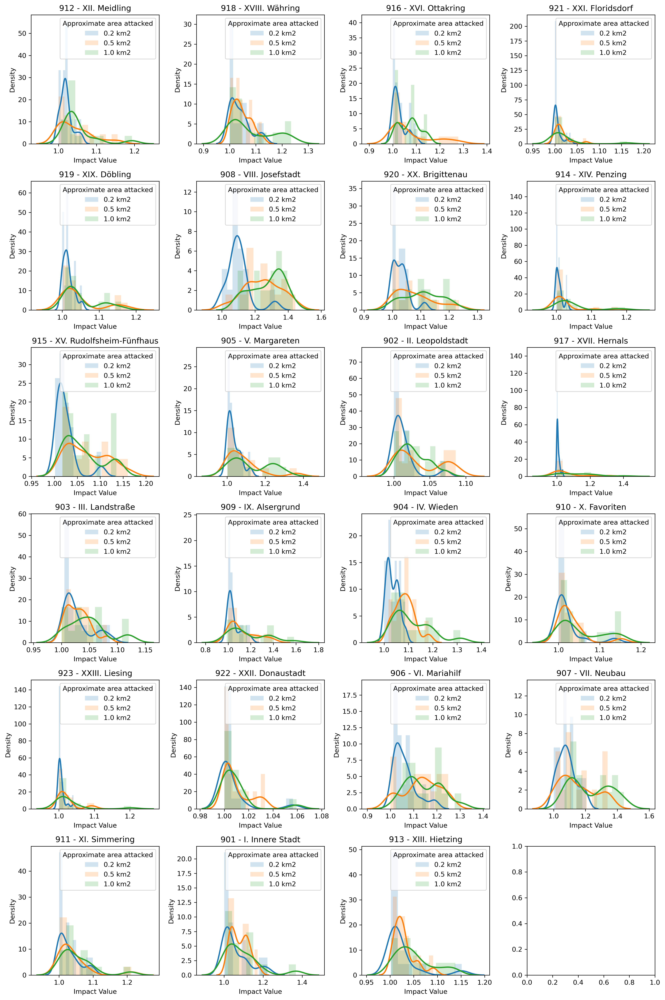

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

n_districts = len(districts_labels)
n_cols = 4 
n_rows = math.ceil(n_districts / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3.5, n_rows * 3.5), dpi=300)
axes = axes.flatten()  # Flatten axes for easier indexing

# iterate over districts and generate plots
for idx, district in enumerate(districts_labels):
    combined_results = pd.DataFrame()

    # data for the district
    for X in X_values:
        for RUN in range(1, N_RUNS + 1):
            output_file = f"../processed/simulations_{RESPONDER_TYPE}/small_district_impact_results_size_{X}_run_{RUN}.csv"
            df = pd.read_csv(output_file)

            # distribution of self impacts
            filtered_df = df[
                (df["District_Attacked"] == district) &
                (df["District_Impacted"] == district)
            ].copy()

            filtered_df["X"] = X
            combined_results = pd.concat([combined_results, filtered_df], ignore_index=True)

    trend_stats = combined_results.groupby("X")["Impact_Value"].agg(["mean", "std", "median"]).reset_index()

    # plot on the corresponding subplot
    ax = axes[idx]
    for X in X_values:
        subset = combined_results[combined_results["X"] == X]

        hist = ax.hist(
            subset["Impact_Value"],
            bins=10,
            alpha=0.2,
            label=f"{X_area_dict[X]} km2",
            density=True
        )
        
        hist_color = hist[2][0].get_facecolor()
        sns.kdeplot(
            subset["Impact_Value"],
            color=hist_color,
            linewidth=2,
            bw_adjust=0.7,
            ax=ax
        )

    ax.set_title(f"{int(district)} - {district_name_dict[district]}")
    ax.set_xlabel("Impact Value")
    ax.set_ylabel("Density")
    ax.legend(title="Approximate area attacked")

plt.tight_layout()

plt.savefig(f"../figures/RNVI/district_impact_distributions_{RESPONDER_TYPE}.pdf", dpi=300, bbox_inches="tight")
plt.show()



## RNVI across districts

In [10]:
RUNs = range(1, N_RUNS)

# dictionary to collect the results for all districts
all_district_X_results = {}

for X in X_values:

    all_district_results = {}

    for district in districts_labels:
        results_self = []
        results_other = []

        for RUN in RUNs:

            output_file = f"../processed/simulations_{RESPONDER_TYPE}/small_district_impact_results_size_{X}_run_{RUN}.csv"
            df = pd.read_csv(output_file)

            # self impact statistics
            self_impact = df[
                (df["District_Attacked"] == district) & 
                (df["District_Impacted"] == district)
            ]["Impact_Value"].values[0]
            results_self.append(self_impact)

            # overall impact (other districts)
            df_other = df[
                (df["District_Attacked"] == district) & 
                (df["District_Impacted"] != district)
            ]
            mean_other_impact = df_other["Impact_Value"].mean()
            results_other.append(mean_other_impact)

        # store results
        all_district_results[district] = {
            "self_mean": np.mean(results_self),
            "self_std": np.std(results_self),
            "other_mean": np.mean(results_other),
            "other_std": np.std(results_other),
        }

    all_district_X_results[X] = all_district_results

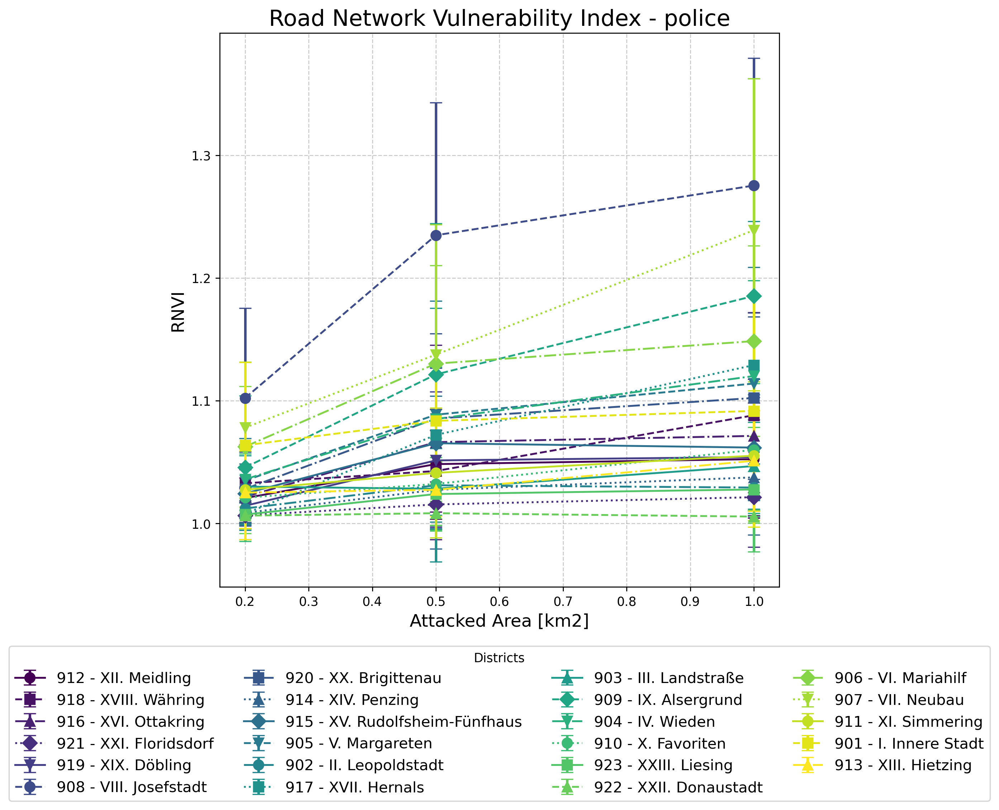

In [11]:

plot_data = {district: {"self_means": [], "self_stds": []} for district in districts_labels}

for X in X_values:
    district_results = all_district_X_results[X]  # Get the results for the current X value
    for district in districts_labels:
        plot_data[district]["self_means"].append(district_results[district]["self_mean"])
        plot_data[district]["self_stds"].append(district_results[district]["self_std"])

# different color codings and marker styles
colors = cm.viridis(np.linspace(0, 1, len(districts_labels)))
line_styles = ['-', '--', '-.', ':']
markers = ['o', 's', '^', 'D', 'v']

# plot self_mean across X_values for each district
plt.figure(figsize=(10, 10), dpi = 250)

X_values_mapping = [float(X_area_dict[X]) for X in X_values]
for idx, district in enumerate(districts_labels):
    means = plot_data[district]["self_means"]
    stds = plot_data[district]["self_stds"]

    # use different line styles and markers for each district
    plt.errorbar(
        X_values_mapping, 
        means, 
        yerr=stds, 
        label=f"{int(district)} - {district_name_dict[district]}", 
        capsize=5, 
        marker=markers[idx % len(markers)], 
        linestyle=line_styles[idx % len(line_styles)], 
        color=colors[idx], 
        markersize=8, 
        elinewidth=2
    )

plt.title(f"Road Network Vulnerability Index - {RESPONDER_TYPE}", fontsize=18)
plt.xlabel("Attacked Area [km2]", fontsize=14)
plt.ylabel("RNVI", fontsize=14)

# update legend
plt.legend(
    title="Districts", 
    fontsize=12, 
    loc='lower center', 
    bbox_to_anchor=(0.5, -0.4), 
    fancybox=True, 
    ncol=4
)
plt.grid(alpha=0.4, linestyle='--', color='gray')

plt.tight_layout(pad=2.0)
plt.savefig(f"../figures/RNVI/district_RNVI_vs_area_{RESPONDER_TYPE}.pdf", dpi=300, bbox_inches="tight")
plt.show()


# Map Visualizations

In [12]:
# reference attacked area to plot
X_ref = 6000

district_self_means = {district: np.round(values['self_mean'],2) for district, values in all_district_X_results[X_ref].items()}
district_other_means = {district: np.round(values['other_mean'],2) for district, values in all_district_X_results[X_ref].items()}

gdf_districts['self_impact_mean'] = gdf_districts['STATAUSTRI'].map(district_self_means)
gdf_districts['other_impact_mean'] = gdf_districts['STATAUSTRI'].map(district_other_means)

## Interactive MAP

In [13]:
gdf_districts = gdf_districts[['NAMEK', 'NAMEK_RZ', 'Total_Population', 'BEZ_RZ', 'NAMEG', 
       'BEZ', 'STATAUSTRI',
        'geometry', 'DISTRICT_CODE',
       'self_impact_mean', 'other_impact_mean']]

gdf = gdf_districts
gdf['RNVI'] = gdf_districts['self_impact_mean']
gdf['District Name'] = gdf_districts['NAMEK_RZ']
gdf['Population'] = gdf_districts['Total_Population']


In [14]:
# generate geojson for plotly map
gdf.to_file(f"../processed/vienna_districts_{RESPONDER_TYPE}.geojson", driver="GeoJSON")

In [15]:
import plotly.express as px
import geopandas as gpd
import json

# Load GeoJSON file
geojson_data = f"../processed/vienna_districts_{RESPONDER_TYPE}.geojson"
with open(geojson_data, 'r') as f:
    geojson = json.load(f)

# Load GeoDataFrame
gdf = gpd.read_file(geojson_data)

color_scale_oranges = [
    [0, "rgba(255, 255, 255, 0.3)"],  
    [0.25, "rgba(255, 204, 153, 0.45)"],
    [0.5, "rgba(255, 140, 0, 0.6)"], 
    [0.75, "rgba(255, 102, 0, 0.75)"], 
    [1, "rgba(204, 51, 0, 0.7)"]
]

# Define a red color scale with transparency
color_scale_reds = [
    [0, "rgba(255, 255, 255, 0.3)"], 
    [0.25, "rgba(255, 204, 204, 0.45)"],
    [0.5, "rgba(255, 102, 102, 0.6)"],
    [0.75, "rgba(204, 0, 0, 0.75)"], 
    [1, "rgba(153, 0, 0, 0.7)"] 
]

if  RESPONDER_TYPE == 'police':
    color_scale_selected = color_scale_reds
else:
    color_scale_selected = color_scale_oranges

# Plot the choropleth map
fig = px.choropleth_mapbox(
    gdf,                                   # The original GeoDataFrame
    geojson=geojson,                       # GeoJSON data
    locations='DISTRICT_CODE',             # Column linking to GeoJSON properties
    color='RNVI',              # Column for coloring
    featureidkey="properties.DISTRICT_CODE",  # GeoJSON property to match locations
    mapbox_style="carto-positron",         # Base map style
    center={"lat": 48.2082, "lon": 16.3738},  # Center on Vienna
    zoom=10,                               # Zoom level
    color_continuous_scale=color_scale_selected,  # Custom red color scale
    title="District RNVI in Vienna",        # Title of the map
    hover_name="DISTRICT_CODE",            # Show district code on hover
    hover_data=["RNVI","District Name","Population"],       # Show self_impact_mean on hover
)

# Customize the layout of the map for better aesthetics
fig.update_layout(
    margin={"r":0,"t":50,"l":0,"b":0},  # Reduce margins for a more compact view
    title_text=f"District RNVI (Road Network Vulnerability Index) - {RESPONDER_TYPE}",  # Title text
    title_x=0.5,                        # Center the title
    title_font_size=24,                  # Increase title font size
    mapbox_style="carto-positron",       # Set mapbox style
    geo=dict(
        bgcolor="rgba(0,0,0,0)",         # Remove background color
        lakecolor="rgb(255, 255, 255)",  # Set water background to white
    ),
    font=dict(
        size=14,  # Set default font size
        color="black",  # Set font color to black
    ),
    showlegend=False,  # Hide the legend for a cleaner look
)

fig.add_annotation(
    text="District-based RNVI (Road Network Vulnerability Index):<br>"
        f"RNVI estimates the average factor by which travel times for closest {RESPONDER_TYPE} responders are increased<br>"
          "when accessing an area within the district after a random attack disrupts the road network.<br>"

        #For example, an index value of 1.20 indicates that travel times are 20% longer for first responders to reach their destination following the disruption."
        # "Each district is shaded based on its RNVI value. Hover over a district to see more details."
        ,
    xref="paper", yref="paper",       # Use relative coordinates
    x=0.5, y=-0.1,                    # Position it below the map
    showarrow=False,                  # No arrow pointing to the map
    font=dict(size=14, color="black"), # Set font size and color
    align="center",                   # Center-align the text
    bordercolor="black",              # Add border color for better visibility
    borderwidth=2,                    # Set border width
    borderpad=4,                      # Set padding around the text
    bgcolor="rgba(255, 255, 255, 0.8)" # Background for better readability
)

# Adjust the layout to ensure there's enough space for annotation
fig.update_layout(
    margin={"r":0, "t":50, "l":0, "b":100},  # Increase bottom margin to make room for the annotation
)

# Save the figure as an HTML file with additional settings for a prettier view
fig.write_html(f"../figures/maps/RNVI_Wien_{RESPONDER_TYPE}.html", include_plotlyjs="cdn", full_html=True)


# Show the figure
fig.show()
